(In order to load the stylesheet of this notebook, execute the last code cell in this notebook)

# Stack Overflow

## Introduction 

In this assignment, we will look at some posts on Stack Overflow during the year of 2015 and measure the similarity of users by looking at the types of questions they answer. We will also analyze the creation dates of questions.

## Step 0. Preparation

Before we start working on the notebook, let's make sure that everything is setup properly. You should have downloaded and installed
* [Anaconda](https://store.continuum.io/cshop/anaconda/)
* [Git](http://git-scm.com/downloads)

If you are working from the undergraduate lab (on a linux machine) these are both installed, but you need to follow the instructions [from here](https://github.com/datascience16/lectures/blob/master/Lecture2/Getting-Started.ipynb).



## Step 1. Getting the data

Let's make a sample request to retrieve the questions posted on Stack Exchange on the first day of 2015. Documentation of the Stack Exchange API can be found [here](https://api.stackexchange.com/docs).

In [10]:
import requests

start_time = 1420070400 # 01-01-2015 at 00:00:00
end_time   = 1420156800 # 01-02-2015 at 00:00:00

response = requests.get("https://api.stackexchange.com/2.2/questions?pagesize=100" +
                        "&fromdate=" + str(start_time) + "&todate=" + str(end_time) +
                        "&order=asc&sort=creation&site=stackoverflow")
print response

<Response [200]>


Documentation: We use the api call provided by stackoverflow to get all the data within given 
start date and end time and print the response.

All dates in the Stack Exchange API are in [unix epoch time](https://en.wikipedia.org/wiki/Unix_time). The format for the request string is specified [here](https://api.stackexchange.com/docs/questions).

We can try to print the response that Stack Exchange returns.

In [378]:
print response.text

{"items":[{"tags":["php","mysql","arrays","mysqli"],"owner":{"reputation":156,"user_id":3210431,"user_type":"registered","accept_rate":78,"profile_image":"https://i.stack.imgur.com/QTjBV.jpg?s=128&g=1","display_name":"salep","link":"http://stackoverflow.com/users/3210431/salep"},"is_answered":true,"view_count":199,"accepted_answer_id":27727478,"answer_count":2,"score":0,"last_activity_date":1420071815,"creation_date":1420070458,"question_id":27727385,"link":"http://stackoverflow.com/questions/27727385/inserting-multiple-records-into-mysql-from-an-array","title":"Inserting multiple records into MySQL from an array"},{"tags":["apache-pig"],"owner":{"reputation":6,"user_id":868779,"user_type":"registered","profile_image":"https://www.gravatar.com/avatar/19f7315b44e97ca1bc069694fdba7428?s=128&d=identicon&r=PG","display_name":"Balpreet Pankaj","link":"http://stackoverflow.com/users/868779/balpreet-pankaj"},"is_answered":false,"view_count":223,"answer_count":1,"score":1,"last_activity_date":

Documentation :Print the response in text form.

It is not possible to read the raw response. Instead, we need to decode the raw response as JSON and use the `json` library to print it.

In [13]:
import json

print json.dumps(response.json(), indent=2)

{
  "has_more": true, 
  "items": [
    {
      "is_answered": true, 
      "view_count": 199, 
      "tags": [
        "php", 
        "mysql", 
        "arrays", 
        "mysqli"
      ], 
      "last_activity_date": 1420071815, 
      "answer_count": 2, 
      "creation_date": 1420070458, 
      "score": 0, 
      "link": "http://stackoverflow.com/questions/27727385/inserting-multiple-records-into-mysql-from-an-array", 
      "accepted_answer_id": 27727478, 
      "owner": {
        "user_id": 3210431, 
        "profile_image": "https://i.stack.imgur.com/QTjBV.jpg?s=128&g=1", 
        "user_type": "registered", 
        "reputation": 154, 
        "link": "http://stackoverflow.com/users/3210431/salep", 
        "accept_rate": 78, 
        "display_name": "salep"
      }, 
      "title": "Inserting multiple records into MySQL from an array", 
      "question_id": 27727385
    }, 
    {
      "is_answered": false, 
      "view_count": 223, 
      "tags": [
        "apache-pig"
      

Documentation: Print the json form of the text result.

Now we can easily see that the response consists of a list of question items. For each of these items, we get information about its attributes such as its `creation_date`, `answer_count`, `owner`, `title`, etc.

Notice that has_more is true. To get more items, we can [request the next page](https://api.stackexchange.com/docs/paging).

-----------------

## Step 2. Parsing the responses

In this section, we practice some of the basic Python tools that we learned in class and the powerful string handling methods that Python offers. Our goal is to be able to pick the interesting parts of the response and transform them in a format that will be useful to us.

First let's isolate the creation_date in the response. Fill in the rest of the ```print_creation_dates_json()``` function that reads the response and prints the creation dates. Notice that a JSON object is basically a dictionary. **(5 pts)**

In [14]:
def print_creation_dates_json(response):
    
    decoded_response = json.dumps(response.json(), indent=2)
    jsonResponse=json.loads(decoded_response)
    jsonData = jsonResponse["items"]
    jsoniden = jsonResponse["has_more"]
    
    while(jsoniden):
        for d in jsonData:
            creation_dt = d.get("creation_date")
            question_id = d.get("question_id")
            print "Question_Id: %s. , CreationDate %s" %(question_id,creation_dt)
            
    
    """
    Prints the creation_date of all the questions in the response.
    
    Parameters:
        response: Response object
    """
    

Documentation: Function print_creation_dates_json takes the response from the api call and use has_more property of response when response are more than 100 which is maximum page size of the api response available. We use json.loads to load all the json output.

Write the code that calls the ```print_creation_dates_json()``` function to print out all the creation dates of questions posted on the first day in 2015. Please be aware of Stack Exchange's [rate limit](https://api.stackexchange.com/docs/throttle). **(5 pts)**

In [ ]:
response = requests.get("https://api.stackexchange.com/2.2/questions?pagesize=100" +
                        "&fromdate=" + str(start_time) + "&todate=" + str(end_time) +
                        "&order=asc&sort=creation&site=stackoverflow")
print_creation_dates_json(response)
 

Question_Id: 27727385. , CreationDate 1420070458
Question_Id: 27727388. , CreationDate 1420070503
Question_Id: 27727391. , CreationDate 1420070552
Question_Id: 27727393. , CreationDate 1420070577
Question_Id: 27727394. , CreationDate 1420070611
Question_Id: 27727396. , CreationDate 1420070641
Question_Id: 27727406. , CreationDate 1420070703
Question_Id: 27727407. , CreationDate 1420070727
Question_Id: 27727408. , CreationDate 1420070734
Question_Id: 27727409. , CreationDate 1420070777
Question_Id: 27727410. , CreationDate 1420070801
Question_Id: 27727414. , CreationDate 1420070848
Question_Id: 27727418. , CreationDate 1420070859
Question_Id: 27727419. , CreationDate 1420070866
Question_Id: 27727424. , CreationDate 1420070968
Question_Id: 27727427. , CreationDate 1420071005
Question_Id: 27727429. , CreationDate 1420071029
Question_Id: 27727433. , CreationDate 1420071103
Question_Id: 27727434. , CreationDate 1420071122
Question_Id: 27727439. , CreationDate 1420071175
Question_Id: 2772744

Documentation: Make api call and get all response which is passed to print_creation_dates_json()
to get all question id and creation date  in unix epoch time format of question posted on first day of year 2015.

Due to time constraints, we have downloaded the [data dump](http://cs-people.bu.edu/kzhao/teaching/stackoverflow-posts-2015.tar.gz) for Stack Overflow's posts in 2015. Note that this file is 10GB. If you don't have space on your computer, you can download it into `/scratch` on one of the machines in the undergrad lab or you can download it onto a USB. You may also want to work with a subset of this data at first, but your solution should be efficient enough to work with the whole dataset. For example, if you call `read()` on this file, you will get a `MemoryError`.

Write a function to parse out the questions posted in 2015. These are posts with `PostTypeId=1`. Make a `pandas DataFrame` with 3 columns: `Id`, `CreationDate`, `OwnerUserId`, and the first tag in `Tags`. Save the `DataFrame` to a file named `question_dataframe.csv` using `to_csv()`. **(10 pts)**

In [9]:
#import xml.etree for parsing, pandas and re for regular expression
import xml.etree.ElementTree as etree
import pandas as pd
import re

#declare four lists to store all attributes required 
a=[]
b=[]
c=[]
d=[]
#function for parsing when passed path inside call
def parsing(path):
    for event, elem in etree.iterparse(path, events=('start', 'end', 'start-ns', 'end-ns')):
        for row in elem.findall('row'):
            Id=row.get('Id')
            PostTypeId=row.get('PostTypeId')
            if PostTypeId == '1':
                a.append(Id)
                CreationDate=row.get('CreationDate')
                b.append(CreationDate)
                OwnerUserId=row.get('OwnerUserId')
                c.append(OwnerUserId)
                Tags=row.get('Tags')
                if Tags != None:
                    tag = re.split('<|>', Tags)
                else:
                    tag[1] = "None"
                d.append(tag[1])
    
            #elem.clear() 
            #while elem.getprevious() is not None:
                #del elem.getparent()[0]
        
    data = {'Id': a, 'Creation_Date': b, 'Owner_UserId':c, 'Tags':d }
    df=pd.DataFrame(data)
    #convert to csv file from dataframe having all parsed data
    df.to_csv('/Users/vsanghvi007/Downloads/allquestion_2015.csv', sep='\t')
    #print df

#calling parsing with path of data dump of stackoverflow    
parsing('/Users/vsanghvi007/Downloads/stackoverflow-posts-2015.xml')   

Documentation: Parsing function takes path as file. Check for Posttypeid and if its one , it 
    appends the attributes one by one in lists created. Then create Dataframe from the lists and 
    convert dataframe to csv format. 

In [4]:
import pandas
#read the csv file got saved at path given
question_df = pandas.read_csv('/Users/vsanghvi007/Downloads/allquestion_2015.csv')
#print the csv data
print question_df


                   \tCreation_Date\tId\tOwner_UserId\tTags
0        0\t2015-01-01T00:00:58.253\t27727385\t3210431\...
1        1\t2015-01-01T00:01:43.673\t27727388\t868779\t...
2        2\t2015-01-01T00:00:58.253\t27727385\t3210431\...
3        3\t2015-01-01T00:01:43.673\t27727388\t868779\t...
4        4\t2015-01-01T00:02:32.123\t27727391\t4372672\...
5        5\t2015-01-01T00:02:57.983\t27727393\t2482149\...
6        6\t2015-01-01T00:03:31.337\t27727394\t4263870\...
7        7\t2015-01-01T00:04:01.407\t27727396\t4409381\...
8         8\t2015-01-01T00:05:03.773\t27727406\t875317\tc#
9        9\t2015-01-01T00:05:27.167\t27727407\t821742\t...
10       10\t2015-01-01T00:05:34.733\t27727408\t2595033...
11       11\t2015-01-01T00:06:17.720\t27727409\t1815395...
12       12\t2015-01-01T00:06:41.067\t27727410\t541091\...
13       13\t2015-01-01T00:07:28.747\t27727414\t1210038...
14       14\t2015-01-01T00:07:39.243\t27727418\t3674356...
15       15\t2015-01-01T00:07:46.460\t27727419\t347062\.

Documentation: Access the csv file saved at path  and print the contents of csv. 

## Step 3. Putting it all together

We are now ready to tackle our original problem. Write a function to measure the similarity of the top 1000 users with the most answer posts. Compare the users based on the types of questions they answer. We will categorize the questions by looking at the first tag in each question. You may choose to implement any one of the similarity/distance measures we discussed in class. Document your findings. **(30pts)**

Note that answers are posts with `PostTypeId=2`. The ID of the question in answer posts is the `ParentId`.

You may find the [sklearn.feature_extraction module](http://scikit-learn.org/stable/modules/feature_extraction.html) helpful.

[[ 0.          0.98275862  0.94444444 ...,  0.95744681  1.          1.        ]
 [ 0.98275862  0.          1.         ...,  1.          1.          0.98076923]
 [ 0.94444444  1.          0.         ...,  1.          1.          1.        ]
 ..., 
 [ 0.95744681  1.          1.         ...,  0.          1.          1.        ]
 [ 1.          1.          1.         ...,  1.          0.          1.        ]
 [ 1.          0.98076923  1.         ...,  1.          1.          0.        ]]


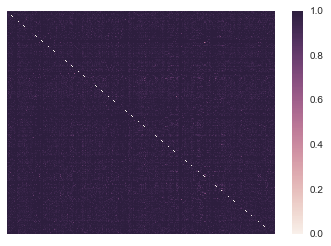

In [2]:
#importing all required libraries as and when required
import xml.etree.ElementTree as etree
import pandas as pd
import re
import numpy as np
from sklearn.feature_extraction.text import CountVectorizer
import datetime as dt
from scipy.spatial.distance import cosine
from collections import defaultdict,Counter
from sklearn.metrics.pairwise import cosine_similarity
import sklearn.metrics as metrics
from sklearn.metrics import pairwise_distances
import seaborn as sns
import matplotlib.pyplot as plt
import matplotlib as mpl
%matplotlib inline

#parsing the data dump to get postTypeid = 2 attributes 
for event, elem in etree.iterparse(r'/Users/vsanghvi007/Downloads/stackoverflow-posts-2015.xml', events=('start', 'end', 'start-ns', 'end-ns')):
#declare lists to store all attributes    
    e=[]
    f=[]
    g=[]
    h=[]
    l=[]
            
for row in elem.findall('row'):
    Id=row.get('Id')
    PostTypeId=row.get('PostTypeId')
    if PostTypeId == '2':
        e.append(Id)
        ParentId=row.get('ParentId')
        f.append(ParentId)
        OwnerUserId=row.get('OwnerUserId')
        g.append(OwnerUserId)
    if PostTypeId == '1':
        h.append(Id)
        Tags=row.get('Tags')
        if Tags != None:
            tag = re.split('<|>', Tags)
        else:
            tag[1] = "None"
        l.append(tag[1])

#create dataframe for attributes required for answer posts
data = {'Id': e, 'Owner_UserId':g}
df1=pd.DataFrame(data)   

#group by owner user id and count to get top 1000 user        
df2=df1.groupby('Owner_UserId').count()
df3=df2.sort_values(by='Id', ascending=[False])
df4=df3.head(1000)

#get all parents_Id along with Owner_UserId 
dd1 = {'Owner_UserId': g, 'Id': f}
df5=pd.DataFrame(dd1)

# get index of top 1000 user to save as list and then get dataframe
lis = df4.index.tolist()
dd2 = {'Owner_UserId': lis}
df6=pd.DataFrame(dd2)
#print df6

#get Id and Tag from question post of data dump
dd3 = {'Id': h, 'Tags': l}
df7=pd.DataFrame(dd3)

#get owner user id along with Id from answer post
mergedf = pd.merge(df6, df5, on=['Owner_UserId'], how='inner')

#merge on Id from question post and answer post 
df8 = pd.merge(mergedf, df7, on=['Id'], how='inner')
del df8['Id']
#print df8

Taglist = df8.groupby('Owner_UserId')['Tags'].apply(lambda x: x.tolist())
#print Taglist

#declare list to get all elements of list (which are again list of tags for each user) and convert it to string as required to vectorise and plot similarity matrix
ll = []
for i in range(0,len(Taglist)):
    str1 = ' '.join(Taglist[i])
    ll.append(str1)
    #print str1
#print ll

#create object CountVectorizer
vectorizer = CountVectorizer(min_df=1)
#use fit_transform to calculate vectors of tags for each user
tagvec = vectorizer.fit_transform(ll)
#get vector in array to pass to similairty matrix plot function
tagarr= tagvec.toarray()
#print tagarr

#using jaccard metric to calculate distance between pair of user
s = metrics.pairwise_distances(tagarr,Y=None,metric='jaccard', n_jobs=1)
print s
#plot heatmap to see the visual similarity matrix 
sns.heatmap(s, xticklabels=False, yticklabels=False, linewidths=0)        

Plot the top 100 most similar users. See [Lecture 3](https://github.com/datascience16/lectures/blob/master/Lecture3/Distance-Functions.ipynb) for examples. **(10 pts)**

Let's plot a subset of the distance matrix. Order the pairwise distance in your distance matrix 
(excluding the entries along the diagonal) in increasing order and pick user pairs until you 
have 100 unique users. See Lecture 3 for examples. (10 pts)

[[ 0.          1.          1.         ...,  1.          1.          1.        ]
 [ 1.          0.          0.97777778 ...,  1.          1.          0.96296296]
 [ 1.          0.97777778  0.         ...,  0.97826087  1.          1.        ]
 ..., 
 [ 1.          1.          0.97826087 ...,  0.          1.          1.        ]
 [ 1.          1.          1.         ...,  1.          0.          1.        ]
 [ 1.          0.96296296  1.         ...,  1.          1.          0.        ]]


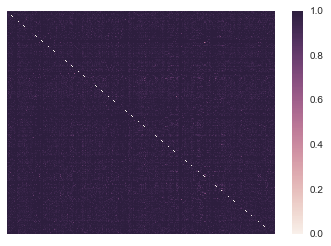

In [66]:
#get the 1000*1000 matrix 
#print s
#get all elements of matrix in 1d array
dist = s.flatten()
#print dist

#get argsorted index of above 1d array
inde =np.argsort(dist)[::-1]
#print inde

#mod with number of users to get row number and column number
indexval = inde % 1000
#print indexval

#sort the elements of 1d array in descending order
#distance= sorted(dist,reverse=True)
#print distance

#top 100 index value to get top 100 unique users
index = indexval[:100]
#distval = distance[:100]

#print index
#print distval

#put the index values of top 100 unique users into data frame
users =pd.DataFrame(index)
#label column values having index values of 1d array as index1
users.columns=['index1']
#print users

#get list with top 1000 users along with tags to merge to 100 unique user frame
#print Taglist

#convert list to dataframe
aa= pd.DataFrame(Taglist, columns=["Tags"])  
aa['Owner_UserId'] = aa.index
#reset the index to get index values in serial order
aa = aa.reset_index(drop=True)
aa['index1'] = aa.index

#merge to get owner user id and tags of 100 unique user
finalusers = pd.merge(aa, users, on=['index1'], how='inner')
del finalusers['index1']
#print finalusers

#convert the tags list column of dataframe to list
Taglistfinal = finalusers['Tags'].tolist()
#print Taglistfinal

#declare list to convert elements of list to string to vectorise them
lol = []
for i in range(0,len(Taglistfinal)):
    str1 = ' '.join(Taglistfinal[i])
    lol.append(str1)
    #print str1
#print lol

vectorizer = CountVectorizer(min_df=1)
tagsvec = vectorizer.fit_transform(lol)
#convert the vectors to array to apply ditance function
tagsarr= tagsvec.toarray()

#pass the vector of users to jaccard distance metric
sim = metrics.pairwise_distances(tagsarr,Y=None,metric='jaccard', n_jobs=1)
print sim

#plot the heatmap of the 100*100 unique user distance matrix
sns.heatmap(s, xticklabels=False, yticklabels=False, linewidths=0)

Documentation: Here we had 1000 * 1000 matrix of top users.We flattened the distance value to a 1d array and stored sorted index in another 1d array. Picked top 100 values from sorted index as they will mean top 100 unique user. Get owner user id and tags and vectorise and plot similarity matrix like before.

Next, let's create some time series from the data. Look at the top 100 users with the most question posts. For each user, your time series will be the `CreationDate` of the questions posted by that user. You may want to make multiple time series for each user based on the first tag of the questions. Compare the time series using one of the methods discussed in class. Document your findings. **(30 pts)**

You may find the [pandas.DataFrame.resample module](http://pandas.pydata.org/pandas-docs/stable/generated/pandas.DataFrame.resample.html) helpful.

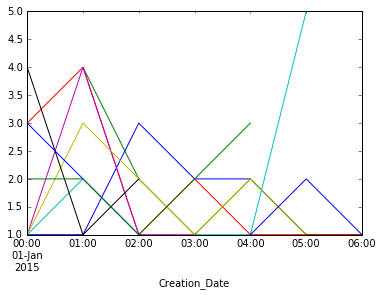

In [2]:
import datetime
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from sklearn.feature_extraction.text import CountVectorizer
import sklearn.metrics as metrics
from sklearn.metrics import pairwise_distances
import xml.etree.ElementTree as etree
import re

%matplotlib inline 




#declare four lists to store all attributes required 
aa=[]
bb=[]
cc=[]
dd=[]
#function for parsing when passed path inside call

for event, elem in etree.iterparse('/Users/vsanghvi007/Downloads/sample.xml', events=('start', 'end', 'start-ns', 'end-ns')):
    for row in elem.findall('row'):
        Id=row.get('Id')
        PostTypeId=row.get('PostTypeId')
        if PostTypeId == '1':
            aa.append(Id)
            CreationDate=row.get('CreationDate')
            bb.append(CreationDate)
            OwnerUserId=row.get('OwnerUserId')
            cc.append(OwnerUserId)
            Tags=row.get('Tags')
            if Tags != None:
                tag = re.split('<|>', Tags)
            else:
                tag[1] = "None"
            dd.append(tag[1])
    
        #elem.clear() 
        #while elem.getprevious() is not None:
            #del elem.getparent()[0]
        
data = {'Id': aa, 'Creation_Date': bb, 'Owner_UserId':cc, 'Tags':dd }
df=pd.DataFrame(data)

d11 = df
newpd=pd.DataFrame()
for tag in ['javascript', 'java','php','c#','android','python','ios','c++','html','jquery']:
    
    d15=d11.loc[d11['Tags'] == tag]
    #print d15
        
    d21=d15.groupby('Owner_UserId').count()
    #print d21
    d31=d21.sort_values(by='Id', ascending=[False])
    #print d31
    d41=d31.head(10)
    #print d41
    
    lis22 = d41.index.tolist()
    #print lis22
    dat22 = {'Owner_UserId': lis22 }
    df202=pd.DataFrame(dat22)
    #print df202
    mrg11 = pd.merge(df202, df, on=['Owner_UserId'], how='inner')
    #print mrg11

    mrg11 = mrg11.set_index(pd.DatetimeIndex(mrg11['Creation_Date']))
    #print mrg11
    times = pd.to_datetime(mrg11.Creation_Date)
    #print times
    data1001=mrg11.groupby([times]).Tags.count().resample('H',how='sum')
    #print data1001
    df1001=pd.DataFrame(data1001)
    #print df1001
    newpd=pd.concat([df1001,newpd],axis=1,join='inner')
    #print newpd
    data1001.plot()
    #print "Time series for" ,tag
    #plt.show()


Plot the 2 most similar and the 2 most different time series. **(10 pts)**

Documentation: The logic behind time series plot for each user based on tags is getting most popular 10 tags* and get all attributes for those tags. After that we get the count of all users for each tag with resample base as their creation date. And plot all 10 tags related time series of users on a graph to see how they trens. The kernel crashes if i run for entire file because the print dataframe in between are commented and entire logic is in for loop so i checked the logic for sample xml file sent along with submission. Also instead of top 100 , i am using top 10 for scalability issues. 
* i checked entire data file to get top 10 populr tags to implement time series on them seperately. The output below is for sample xml file.

[[  0.   1.   1.   1.   1.   1.   1.   1.   1.   1.]
 [  1.   0.   1.   1.   1.   1.   1.   1.   1.   1.]
 [  1.   1.   0.   1.   1.  nan   1.   1.   1.   1.]
 [  1.   1.   1.   0.   1.   1.   1.   1.   1.   1.]
 [  1.   1.   1.   1.   0.   1.   1.   1.   1.   1.]
 [  1.   1.  nan   1.   1.   0.   1.   1.   1.   1.]
 [  1.   1.   1.   1.   1.   1.   0.   1.   1.   1.]
 [  1.   1.   1.   1.   1.   1.   1.   0.   1.   1.]
 [  1.   1.   1.   1.   1.   1.   1.   1.   0.   1.]
 [  1.   1.   1.   1.   1.   1.   1.   1.   1.   0.]]
Time series for 2 most similar tags
Time series for javascript


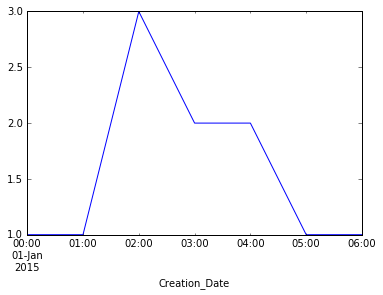

Time series for java


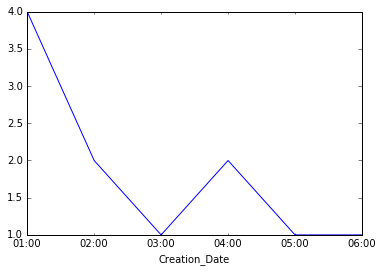

Time series for 2 most dissimilar tags
Time series for javascript


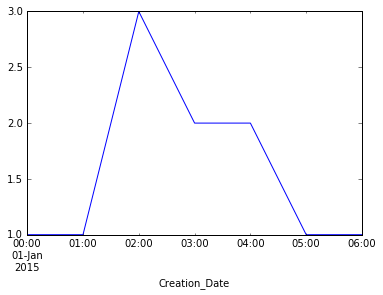

Time series for jquery


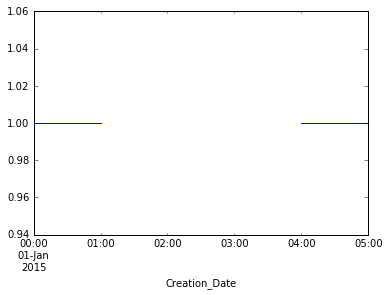

In [8]:
import matplotlib.pyplot as plt
import matplotlib as mpl
import xml.etree.ElementTree as ET
import pandas as pd
import re

newpd.columns=['javascript', 'java','php','c#','android','python','ios','c++','html','jquery']
#print newpd
newlist=newpd.values.T.tolist()
#print newlist
newdic=newpd.to_dict()
#print newdic
vectorizer = CountVectorizer(min_df=1) 
tagsvec = vectorizer.fit_transform(newdic)  
tagsarr= tagsvec.toarray()  
sim = metrics.pairwise_distances(tagsarr,Y=None,metric='jaccard', n_jobs=1) 
print sim
%matplotlib inline

    
d11 = df
newpd1=pd.DataFrame()
newpd2=pd.DataFrame()
#print sim
print "Time series for 2 most similar tags" 
for tag in ['javascript', 'java']:
    
    d15=d11.loc[d11['Tags'] == tag]
#print d15
        
    d21=d15.groupby('Owner_UserId').count()
    #print d21
    d31=d21.sort_values(by='Id', ascending=[False])
    #print d31
    d41=d31.head(10)
    #print d41
    
    lis22 = d41.index.tolist()
    #print lis22
    dat22 = {'Owner_UserId': lis22 }
    df202=pd.DataFrame(dat22)
    mrg11 = pd.merge(df202, df, on=['Owner_UserId'], how='inner')

    mrg11 = mrg11.set_index(pd.DatetimeIndex(mrg11['Creation_Date']))
    #print mrg11
    times = pd.to_datetime(mrg11.Creation_Date)
    #print times
    data1001=mrg11.groupby([times]).Tags.count().resample('H',how='sum')
    
    df1001=pd.DataFrame(data1001)
    #print df1001
    newpd1=pd.concat([df1001,newpd1],axis=1,join='inner')
    data1001.plot()
    print "Time series for" ,tag
    plt.show()
    
print "Time series for 2 most dissimilar tags" 
for tag in ['javascript', 'jquery']:
    
    d15=d11.loc[d11['Tags'] == tag]
#print d15
        
    d21=d15.groupby('Owner_UserId').count()
    #print d21
    d31=d21.sort_values(by='Id', ascending=[False])
    #print d31
    d41=d31.head(10)
    #print d41
    
    lis22 = d41.index.tolist()
    #print lis22
    dat22 = {'Owner_UserId': lis22 }
    df202=pd.DataFrame(dat22)
    mrg11 = pd.merge(df202, df, on=['Owner_UserId'], how='inner')

    mrg11 = mrg11.set_index(pd.DatetimeIndex(mrg11['Creation_Date']))
    #print mrg11
    times = pd.to_datetime(mrg11.Creation_Date)
    #print times
    data1001=mrg11.groupby([times]).Tags.count().resample('H',how='sum')
    df1001=pd.DataFrame(data1001)
    #print df1001
    newpd2=pd.concat([df1001,newpd2],axis=1,join='inner')
    data1001.plot()
    print "Time series for" ,tag
    plt.show()

Documentation: The similarity matrix for time series is plotted in continuation from last question data. And as i already knew from tags data which are two most simialr and dissimialr from similarity matrix plotted . I gave the particular tags in function for plot their time series.
    * Again the output is for sample xml data due to scalibility.

In [14]:
# Code for setting the style of the notebook
from IPython.core.display import HTML
def css_styling():
    styles = open("/Users/vsanghvi007/GitHub/lectures/theme/custom.css", "r").read()
    return HTML(styles)
css_styling()